# Face Generation

### Get the Data
- MNIST
- CelebA


In [1]:
data_dir = './data'

import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST

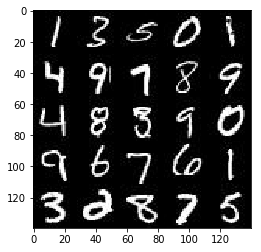

In [2]:
show_n_images = 25

%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.

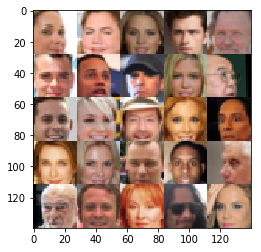

In [3]:
show_n_images = 25

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images are cropped to remove parts of the image that don't include a face, then resized down to 28x28.

## Build the Neural Network
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU

In [4]:
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    with tf.variable_scope('discriminator', reuse=reuse):
        
        alpha=0.2
        
        kernel_initializer=tf.random_normal_initializer(mean=0.0, stddev=0.02)
        
        # Input layer is 28x28x3
        conv = tf.layers.conv2d(images, 64, 1, strides=1, padding='same', kernel_initializer=kernel_initializer)
        conv = tf.maximum(alpha * conv, conv)
        # 28x28x64
        
         
        conv = tf.layers.conv2d(images, 128, 5, strides=2, padding='same', kernel_initializer=kernel_initializer)
        conv = tf.maximum(alpha * conv, conv)
        # 14x14x64
        
        conv = tf.layers.conv2d(conv, 256, 5, strides=2, padding='same', kernel_initializer=kernel_initializer)
        conv = tf.layers.batch_normalization(conv, training=True)
        conv = tf.maximum(alpha * conv, conv)
        # 7x7x128
        
        # Flatten it
        flat = tf.reshape(conv, (-1, 7*7*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
    
    return out, logits

### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [9]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    
    with tf.variable_scope('generator', reuse= not is_train):
        
        initializer=tf.random_normal_initializer(mean=0.0, stddev=0.02)

        z = tf.layers.dense(inputs=z, units=3*3*512, kernel_initializer=initializer)
        # Reshape it to start the convolutional stack
        z = tf.reshape(z, (-1, 3, 3, 512))
        z = tf.layers.batch_normalization(z, training=is_train)
        z = tf.nn.relu(z)
        # 3x3x512 now
        
        z = tf.layers.conv2d_transpose(z, 256, 3, strides=2, padding='valid', kernel_initializer=initializer)
        z = tf.layers.batch_normalization(z, training=is_train)
        z = tf.nn.relu(z)
        # 7x7x256 now
        

        z = tf.layers.conv2d_transpose(z, 128, 5, strides=2, padding='same', kernel_initializer=initializer)
        z = tf.layers.batch_normalization(z, training=is_train)
        z = tf.nn.relu(z)
        # 14x14x128 now
        
        z = tf.layers.conv2d_transpose(z, 64, 5, strides=2, padding='same', kernel_initializer=initializer)
        z = tf.layers.batch_normalization(z, training=is_train)
        z = tf.nn.relu(z)
        # 28x28x64 now

        # Output layer
        logits = tf.layers.conv2d_transpose(z, out_channel_dim, 1, strides=1, padding='same', kernel_initializer=initializer)
        # 28x28x3 now

        out = tf.tanh(logits)

        return out

### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [10]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * 0.9))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss

### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [11]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    
    d_train = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_train = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train, g_train

## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training.

In [12]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train

- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while training.

In [13]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    print('training')
    
    channels = 3
    if data_image_mode == "L":
        channels = 1
        
    # Model inputs
    input_real = tf.placeholder(tf.float32, name='input', shape=(None, 28, 28, channels))
    input_z = tf.placeholder(tf.float32, name='z_input', shape=(None, z_dim))
    lr = tf.placeholder(tf.float32, name='learning_rate')
    
    
    
    # Model Loss
    d_loss, g_loss = model_loss(input_real, input_z, channels)
        
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                batch_images *= 2

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})

                if steps % 100 == 0:
                    
                    show_generator_output(sess, 25, input_z, channels, data_image_mode)
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

    print('done')

### MNIST

training


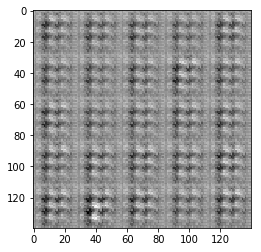

Epoch 1/2... Discriminator Loss: 0.4805... Generator Loss: 3.4416


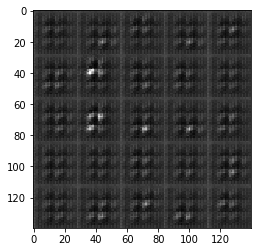

Epoch 1/2... Discriminator Loss: 1.0225... Generator Loss: 4.8892


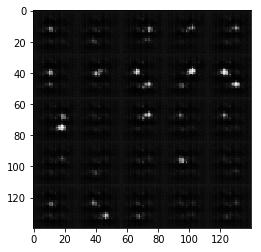

Epoch 1/2... Discriminator Loss: 0.8788... Generator Loss: 1.0052


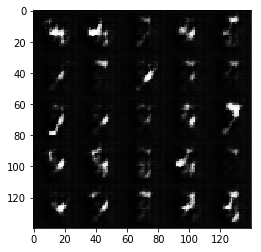

Epoch 1/2... Discriminator Loss: 0.7264... Generator Loss: 1.7431


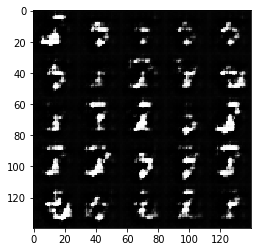

Epoch 1/2... Discriminator Loss: 0.6322... Generator Loss: 1.8483


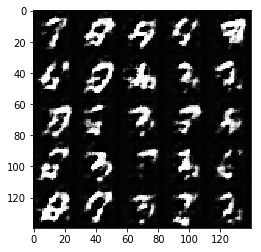

Epoch 1/2... Discriminator Loss: 1.1227... Generator Loss: 2.7752


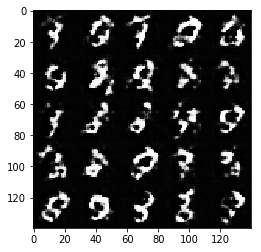

Epoch 1/2... Discriminator Loss: 0.7820... Generator Loss: 1.5366


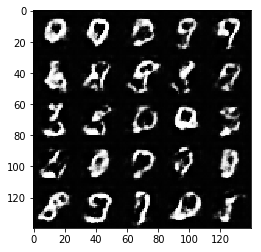

Epoch 1/2... Discriminator Loss: 1.0775... Generator Loss: 0.9719


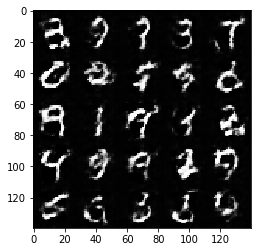

Epoch 1/2... Discriminator Loss: 1.1833... Generator Loss: 0.8789


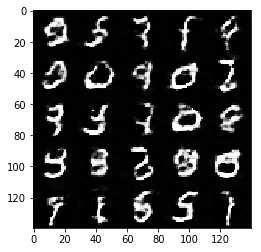

Epoch 1/2... Discriminator Loss: 0.9852... Generator Loss: 1.2581


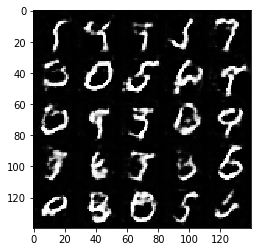

Epoch 1/2... Discriminator Loss: 1.4064... Generator Loss: 0.6137


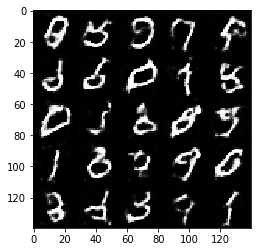

Epoch 1/2... Discriminator Loss: 1.1660... Generator Loss: 1.0399


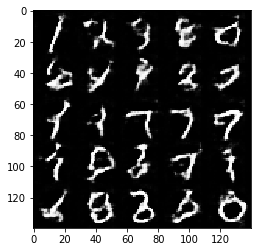

Epoch 1/2... Discriminator Loss: 1.4007... Generator Loss: 0.5623


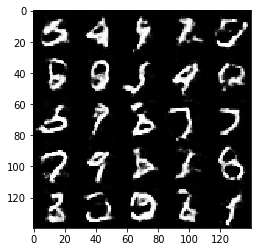

Epoch 1/2... Discriminator Loss: 1.3661... Generator Loss: 0.6489


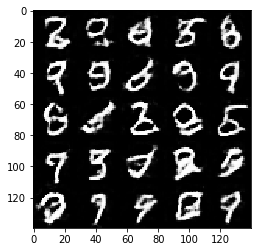

Epoch 1/2... Discriminator Loss: 1.3174... Generator Loss: 0.8145


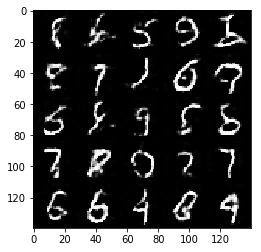

Epoch 1/2... Discriminator Loss: 1.0762... Generator Loss: 1.2599


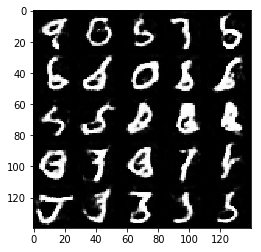

Epoch 1/2... Discriminator Loss: 1.2103... Generator Loss: 1.2281


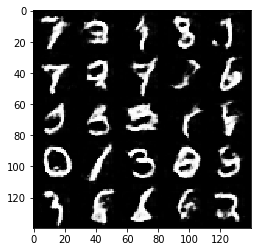

Epoch 1/2... Discriminator Loss: 1.2772... Generator Loss: 0.7030


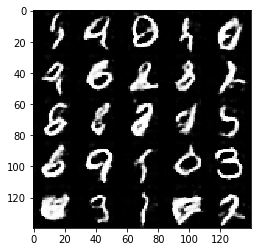

Epoch 2/2... Discriminator Loss: 1.1604... Generator Loss: 1.1246


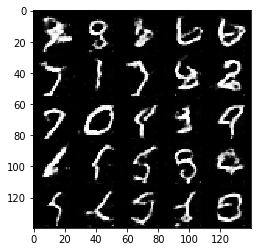

Epoch 2/2... Discriminator Loss: 1.2761... Generator Loss: 1.0397


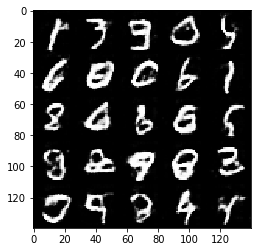

Epoch 2/2... Discriminator Loss: 1.0950... Generator Loss: 1.1539


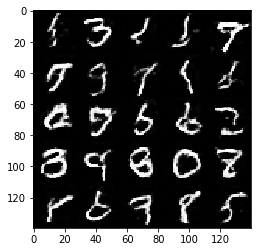

Epoch 2/2... Discriminator Loss: 1.3770... Generator Loss: 0.6869


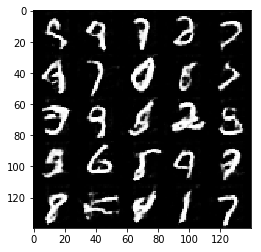

Epoch 2/2... Discriminator Loss: 1.3089... Generator Loss: 0.6343


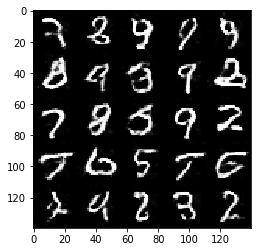

Epoch 2/2... Discriminator Loss: 1.2728... Generator Loss: 0.9831


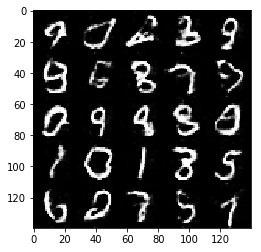

Epoch 2/2... Discriminator Loss: 1.1545... Generator Loss: 1.1819


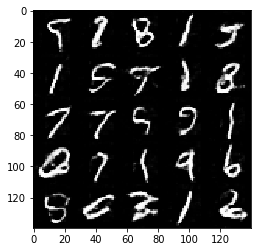

Epoch 2/2... Discriminator Loss: 1.3074... Generator Loss: 0.7597


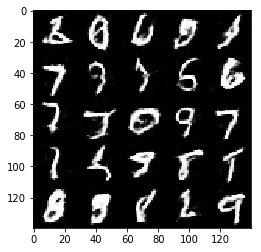

Epoch 2/2... Discriminator Loss: 1.3031... Generator Loss: 0.9849


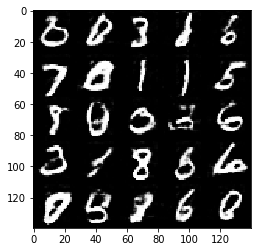

Epoch 2/2... Discriminator Loss: 1.2822... Generator Loss: 0.8476


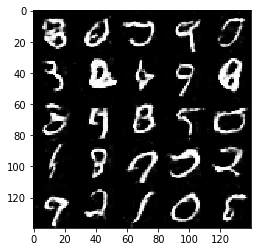

Epoch 2/2... Discriminator Loss: 1.2454... Generator Loss: 1.0827


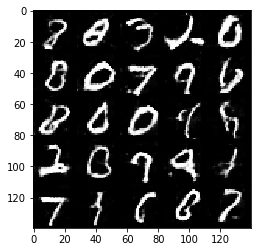

Epoch 2/2... Discriminator Loss: 1.3452... Generator Loss: 0.8511


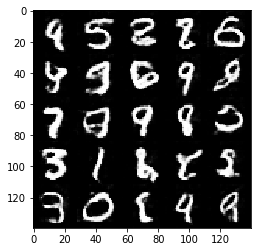

Epoch 2/2... Discriminator Loss: 1.2325... Generator Loss: 0.9800


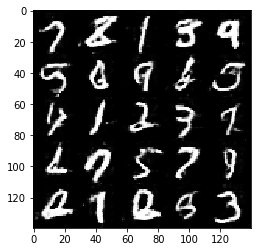

Epoch 2/2... Discriminator Loss: 1.2444... Generator Loss: 0.8289


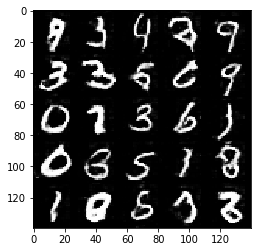

Epoch 2/2... Discriminator Loss: 1.3160... Generator Loss: 0.7890


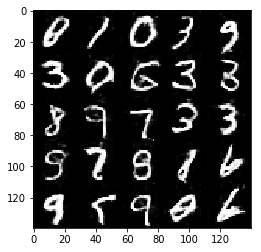

Epoch 2/2... Discriminator Loss: 1.1568... Generator Loss: 1.2459


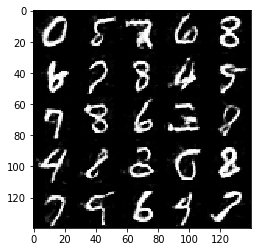

Epoch 2/2... Discriminator Loss: 1.2890... Generator Loss: 0.8517


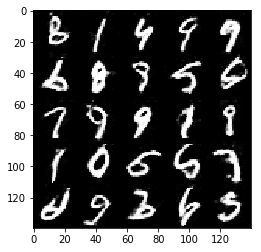

Epoch 2/2... Discriminator Loss: 1.3141... Generator Loss: 0.8865


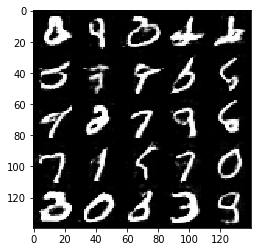

Epoch 2/2... Discriminator Loss: 1.3642... Generator Loss: 0.9503
done


In [22]:
batch_size = 32
z_dim = 100
learning_rate =0.0002
beta1 = 0.5

epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA

training


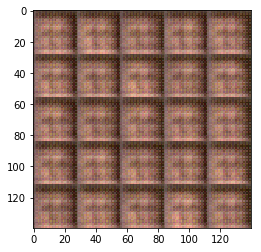

Epoch 1/2... Discriminator Loss: 1.7745... Generator Loss: 0.3900


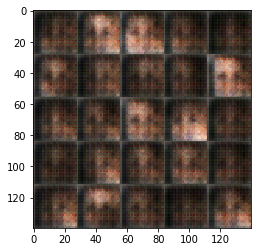

Epoch 1/2... Discriminator Loss: 1.7466... Generator Loss: 0.5379


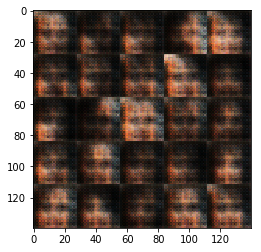

Epoch 1/2... Discriminator Loss: 0.9547... Generator Loss: 1.3177


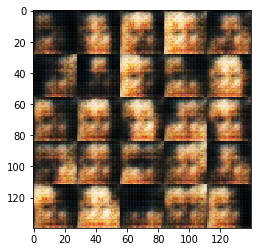

Epoch 1/2... Discriminator Loss: 1.0829... Generator Loss: 1.1623


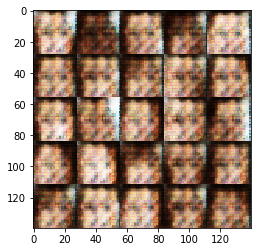

Epoch 1/2... Discriminator Loss: 0.8783... Generator Loss: 1.4405


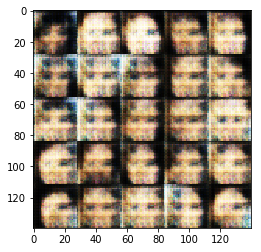

Epoch 1/2... Discriminator Loss: 1.2669... Generator Loss: 0.7631


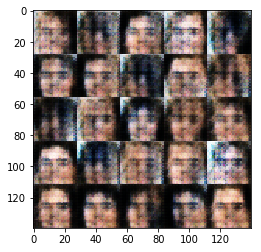

Epoch 1/2... Discriminator Loss: 1.0753... Generator Loss: 1.0733


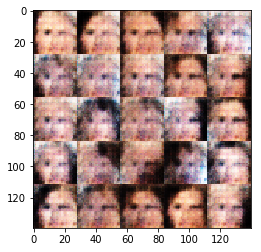

Epoch 1/2... Discriminator Loss: 1.5083... Generator Loss: 0.6138


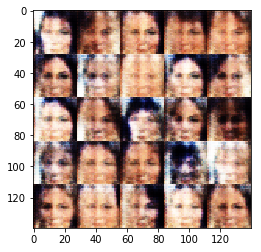

Epoch 1/2... Discriminator Loss: 0.9949... Generator Loss: 1.4185


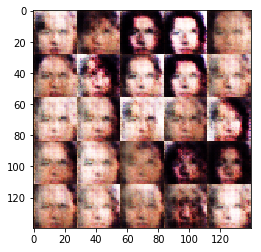

Epoch 1/2... Discriminator Loss: 1.2202... Generator Loss: 1.4447


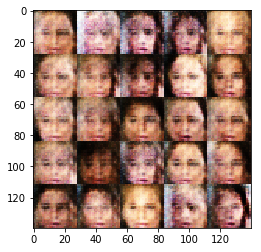

Epoch 1/2... Discriminator Loss: 1.1196... Generator Loss: 1.4483


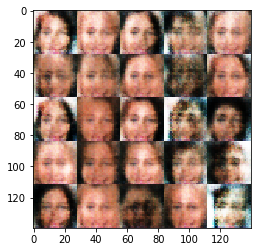

Epoch 1/2... Discriminator Loss: 1.2432... Generator Loss: 1.0471


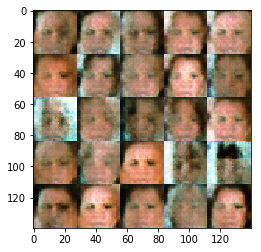

Epoch 1/2... Discriminator Loss: 1.2416... Generator Loss: 1.2283


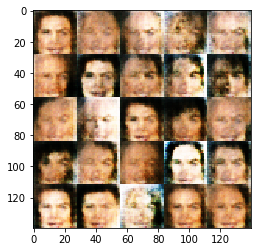

Epoch 1/2... Discriminator Loss: 1.3820... Generator Loss: 0.7461


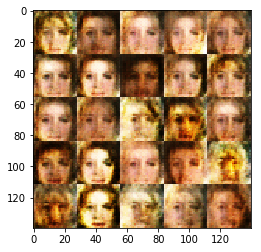

Epoch 1/2... Discriminator Loss: 1.0582... Generator Loss: 1.0605


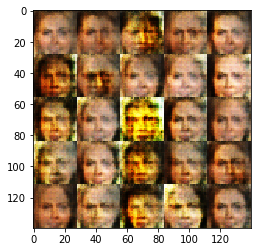

Epoch 1/2... Discriminator Loss: 1.0949... Generator Loss: 1.3251


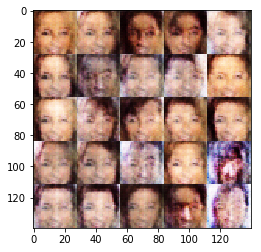

Epoch 1/2... Discriminator Loss: 1.2590... Generator Loss: 0.9486


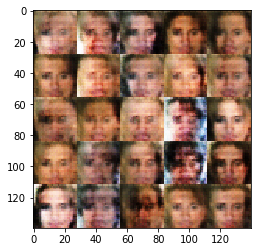

Epoch 1/2... Discriminator Loss: 1.5129... Generator Loss: 0.8239


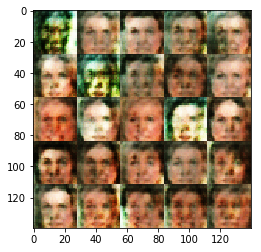

Epoch 1/2... Discriminator Loss: 1.3341... Generator Loss: 0.8943


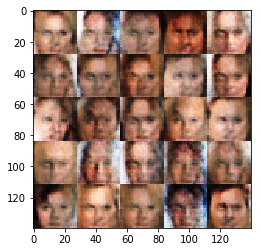

Epoch 1/2... Discriminator Loss: 1.2622... Generator Loss: 1.1369


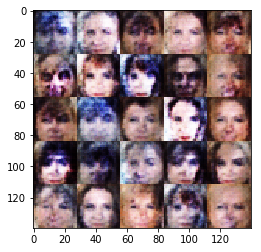

Epoch 1/2... Discriminator Loss: 1.5664... Generator Loss: 0.8929


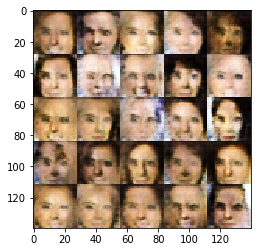

Epoch 1/2... Discriminator Loss: 1.5455... Generator Loss: 0.6500


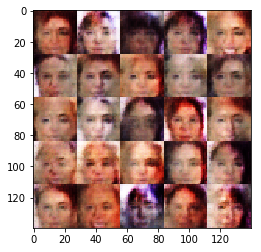

Epoch 1/2... Discriminator Loss: 1.2814... Generator Loss: 0.9372


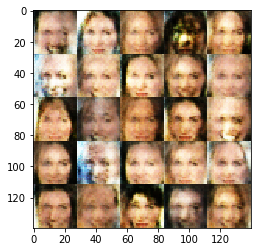

Epoch 1/2... Discriminator Loss: 1.1741... Generator Loss: 1.1208


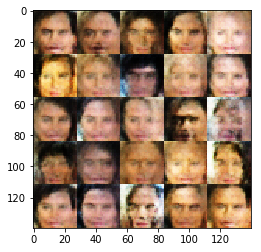

Epoch 1/2... Discriminator Loss: 1.4790... Generator Loss: 0.9581


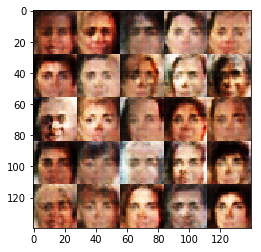

Epoch 1/2... Discriminator Loss: 1.2713... Generator Loss: 0.9717


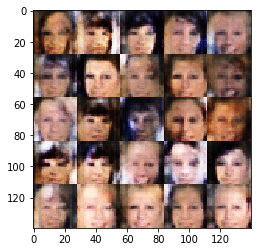

Epoch 1/2... Discriminator Loss: 1.2714... Generator Loss: 1.5210


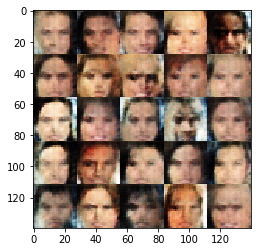

Epoch 1/2... Discriminator Loss: 1.1804... Generator Loss: 1.1143


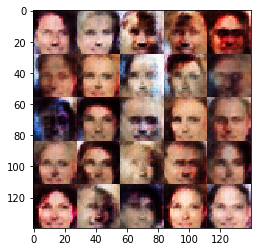

Epoch 1/2... Discriminator Loss: 1.4045... Generator Loss: 0.8085


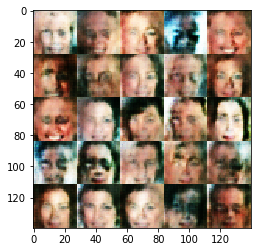

Epoch 1/2... Discriminator Loss: 1.2916... Generator Loss: 1.0424


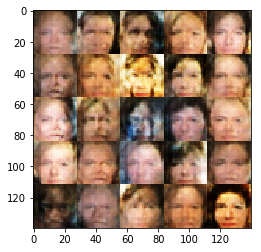

Epoch 1/2... Discriminator Loss: 1.1559... Generator Loss: 1.1998


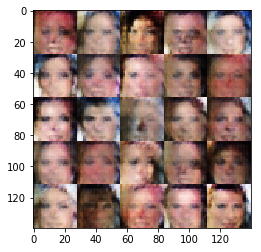

Epoch 1/2... Discriminator Loss: 1.2186... Generator Loss: 0.8382


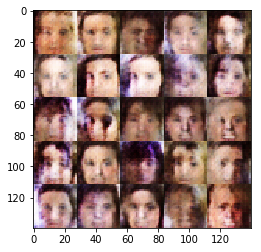

Epoch 1/2... Discriminator Loss: 1.4709... Generator Loss: 1.0558


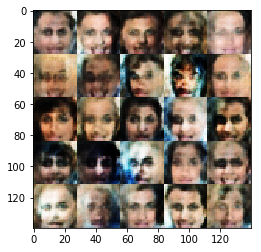

Epoch 1/2... Discriminator Loss: 1.2816... Generator Loss: 1.0438


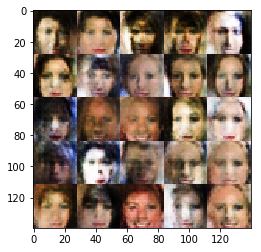

Epoch 1/2... Discriminator Loss: 1.3829... Generator Loss: 0.6189


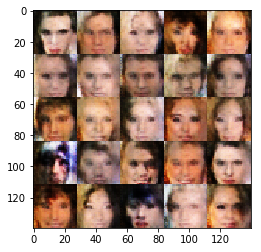

Epoch 1/2... Discriminator Loss: 1.2586... Generator Loss: 0.8999


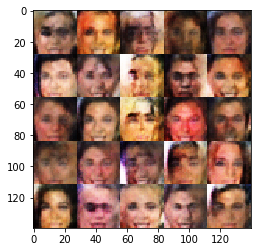

Epoch 1/2... Discriminator Loss: 1.5725... Generator Loss: 0.7670


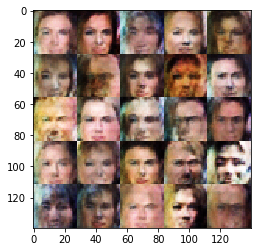

Epoch 1/2... Discriminator Loss: 1.0970... Generator Loss: 1.1120


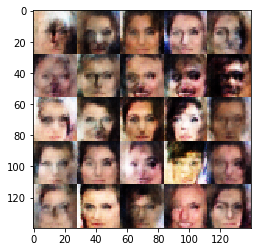

Epoch 1/2... Discriminator Loss: 1.3773... Generator Loss: 0.8621


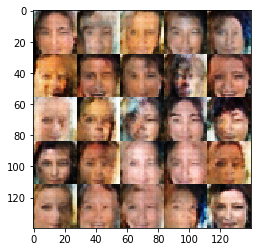

Epoch 1/2... Discriminator Loss: 1.1433... Generator Loss: 0.9003


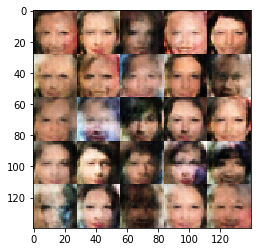

Epoch 1/2... Discriminator Loss: 1.3110... Generator Loss: 0.8272


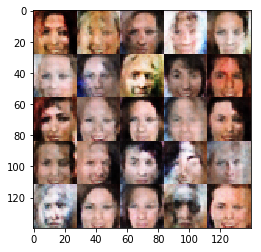

Epoch 1/2... Discriminator Loss: 1.3857... Generator Loss: 0.6984


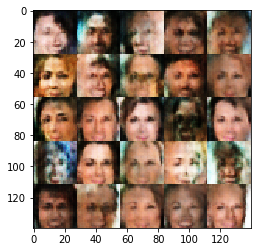

Epoch 1/2... Discriminator Loss: 1.2467... Generator Loss: 1.0427


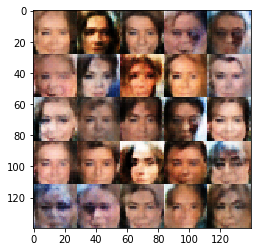

Epoch 1/2... Discriminator Loss: 1.3046... Generator Loss: 0.9514


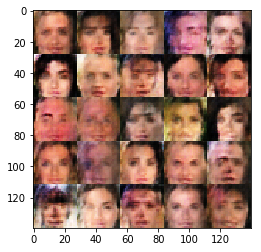

Epoch 1/2... Discriminator Loss: 1.2072... Generator Loss: 0.9552


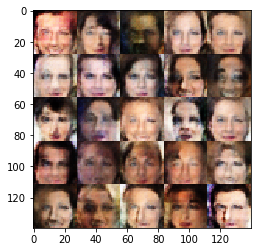

Epoch 1/2... Discriminator Loss: 1.3283... Generator Loss: 0.8868


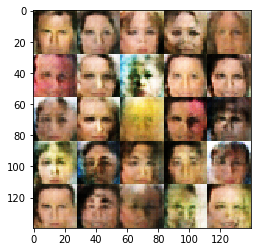

Epoch 1/2... Discriminator Loss: 1.4659... Generator Loss: 0.9783


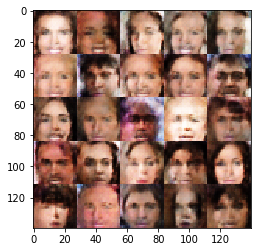

Epoch 1/2... Discriminator Loss: 1.3600... Generator Loss: 0.8958


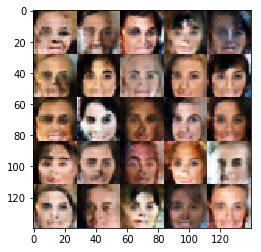

Epoch 1/2... Discriminator Loss: 1.3759... Generator Loss: 0.7805


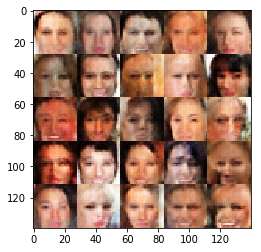

Epoch 1/2... Discriminator Loss: 1.2749... Generator Loss: 0.8616


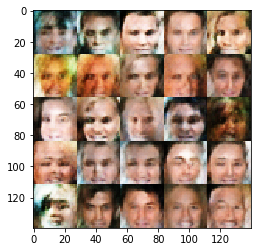

Epoch 1/2... Discriminator Loss: 1.2568... Generator Loss: 1.0488


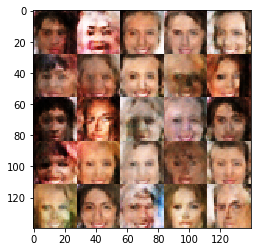

Epoch 1/2... Discriminator Loss: 1.3830... Generator Loss: 0.7776


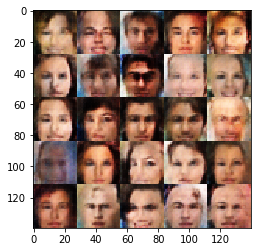

Epoch 1/2... Discriminator Loss: 1.3593... Generator Loss: 1.1277


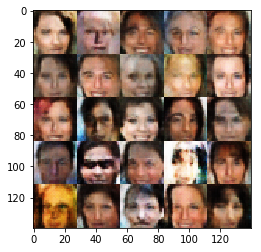

Epoch 1/2... Discriminator Loss: 1.2350... Generator Loss: 0.8641


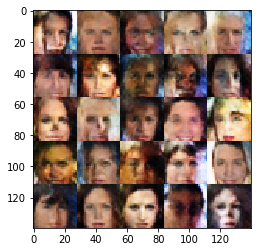

Epoch 1/2... Discriminator Loss: 1.3337... Generator Loss: 1.0474


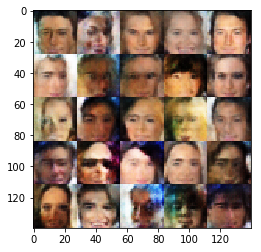

Epoch 1/2... Discriminator Loss: 1.2426... Generator Loss: 0.8770


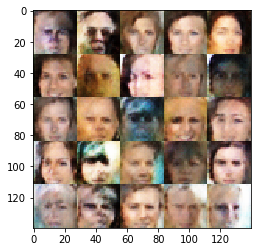

Epoch 1/2... Discriminator Loss: 1.2218... Generator Loss: 1.0181


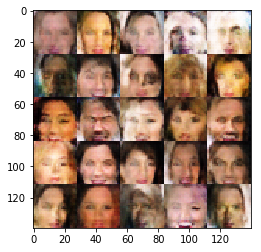

Epoch 1/2... Discriminator Loss: 1.3200... Generator Loss: 1.0841


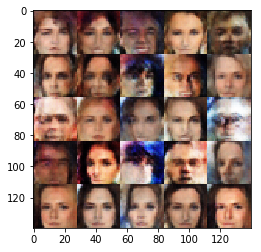

Epoch 1/2... Discriminator Loss: 1.3514... Generator Loss: 0.8439


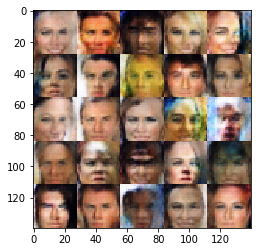

Epoch 1/2... Discriminator Loss: 1.3215... Generator Loss: 0.7912


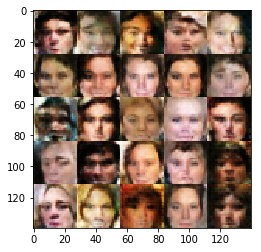

Epoch 1/2... Discriminator Loss: 1.3269... Generator Loss: 0.8266


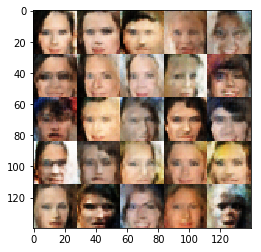

Epoch 1/2... Discriminator Loss: 1.2106... Generator Loss: 0.9016


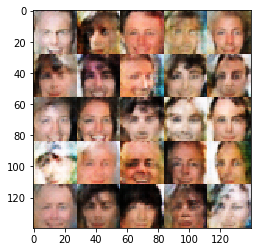

Epoch 1/2... Discriminator Loss: 1.5224... Generator Loss: 0.7305


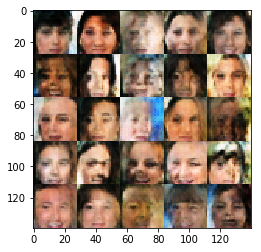

Epoch 2/2... Discriminator Loss: 1.3869... Generator Loss: 0.7404


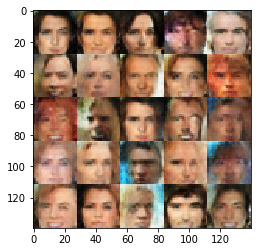

Epoch 2/2... Discriminator Loss: 1.4470... Generator Loss: 0.6687


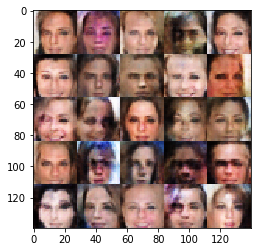

Epoch 2/2... Discriminator Loss: 1.2583... Generator Loss: 0.8381


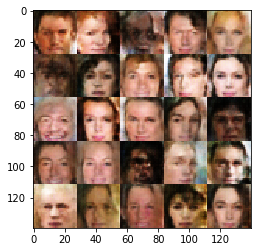

Epoch 2/2... Discriminator Loss: 1.4635... Generator Loss: 0.6961


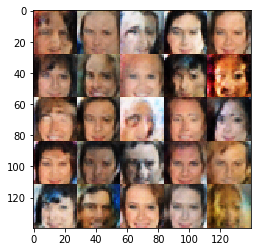

Epoch 2/2... Discriminator Loss: 1.5470... Generator Loss: 0.6335


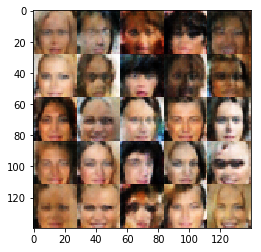

Epoch 2/2... Discriminator Loss: 1.2640... Generator Loss: 0.8297


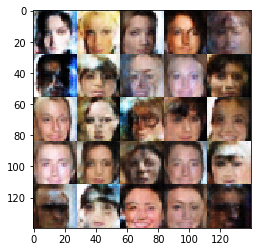

Epoch 2/2... Discriminator Loss: 1.2149... Generator Loss: 0.8543


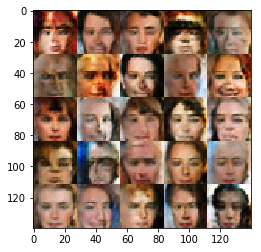

Epoch 2/2... Discriminator Loss: 1.3376... Generator Loss: 0.8526


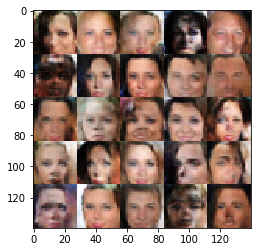

Epoch 2/2... Discriminator Loss: 1.3120... Generator Loss: 0.8509


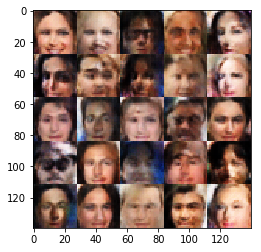

Epoch 2/2... Discriminator Loss: 1.4005... Generator Loss: 0.8772


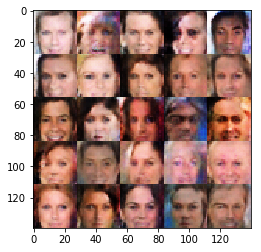

Epoch 2/2... Discriminator Loss: 1.3719... Generator Loss: 0.6655


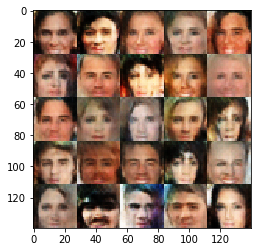

Epoch 2/2... Discriminator Loss: 1.3451... Generator Loss: 0.8921


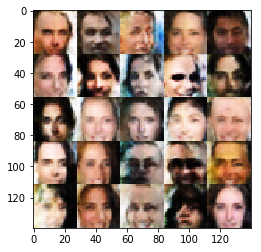

Epoch 2/2... Discriminator Loss: 1.3964... Generator Loss: 0.8568


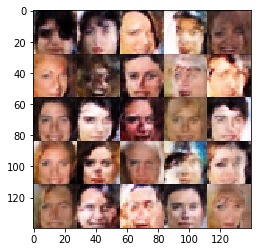

Epoch 2/2... Discriminator Loss: 1.3894... Generator Loss: 0.9578


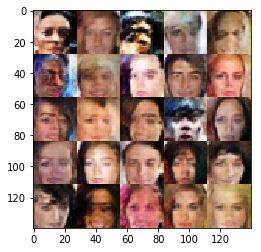

Epoch 2/2... Discriminator Loss: 1.4222... Generator Loss: 0.8431


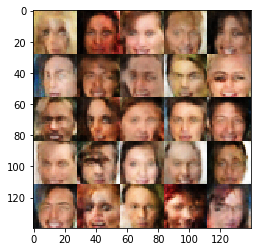

Epoch 2/2... Discriminator Loss: 1.4960... Generator Loss: 0.6775


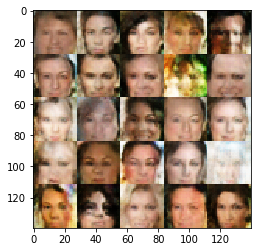

Epoch 2/2... Discriminator Loss: 1.3167... Generator Loss: 0.8316


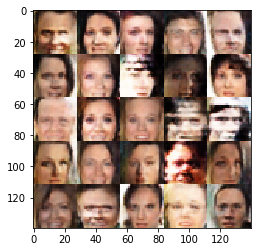

Epoch 2/2... Discriminator Loss: 1.1869... Generator Loss: 1.0429


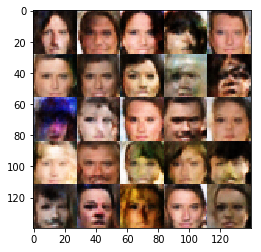

Epoch 2/2... Discriminator Loss: 1.3682... Generator Loss: 0.7759


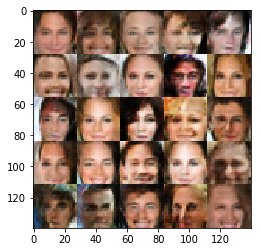

Epoch 2/2... Discriminator Loss: 1.3631... Generator Loss: 0.9316


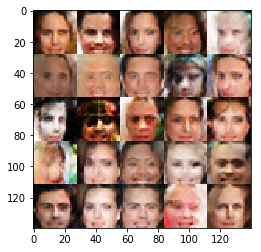

Epoch 2/2... Discriminator Loss: 1.4128... Generator Loss: 0.7737


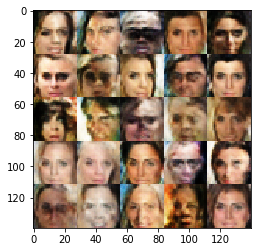

Epoch 2/2... Discriminator Loss: 1.2512... Generator Loss: 0.9281


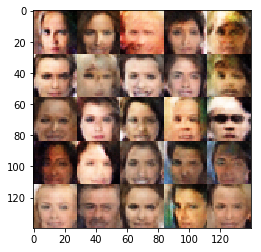

Epoch 2/2... Discriminator Loss: 1.3998... Generator Loss: 0.8178


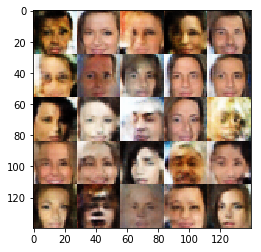

Epoch 2/2... Discriminator Loss: 1.4092... Generator Loss: 0.7273


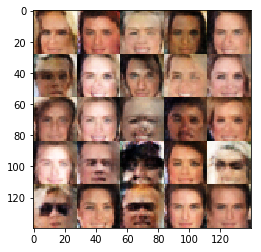

Epoch 2/2... Discriminator Loss: 1.2492... Generator Loss: 0.9819


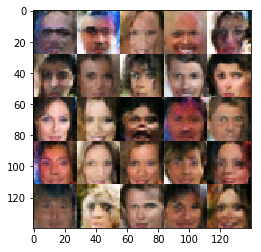

Epoch 2/2... Discriminator Loss: 1.2577... Generator Loss: 0.9674


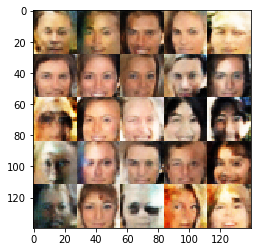

Epoch 2/2... Discriminator Loss: 1.4116... Generator Loss: 0.7303


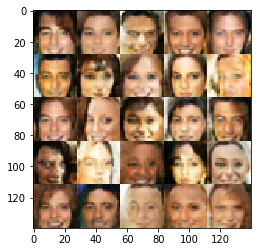

Epoch 2/2... Discriminator Loss: 1.3797... Generator Loss: 0.9080


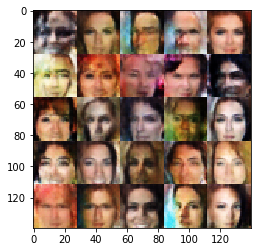

Epoch 2/2... Discriminator Loss: 1.2947... Generator Loss: 0.8404


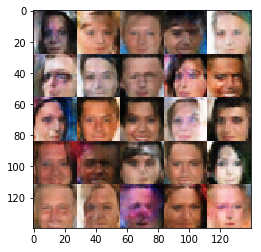

Epoch 2/2... Discriminator Loss: 1.2755... Generator Loss: 0.8951


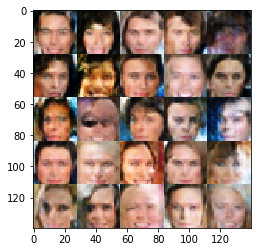

Epoch 2/2... Discriminator Loss: 1.3746... Generator Loss: 0.7269


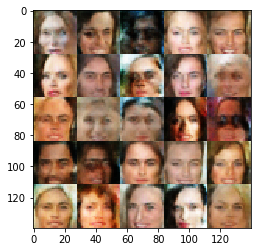

Epoch 2/2... Discriminator Loss: 1.3833... Generator Loss: 0.7235


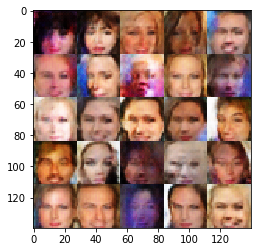

Epoch 2/2... Discriminator Loss: 1.3852... Generator Loss: 0.8151


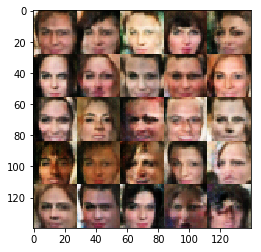

Epoch 2/2... Discriminator Loss: 1.3602... Generator Loss: 0.7671


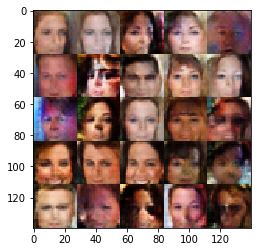

Epoch 2/2... Discriminator Loss: 1.4329... Generator Loss: 0.7659


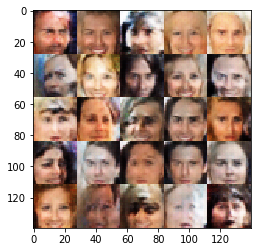

Epoch 2/2... Discriminator Loss: 1.3015... Generator Loss: 0.7309


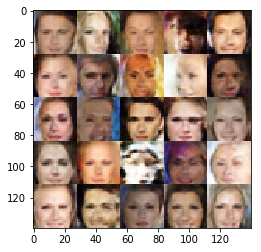

Epoch 2/2... Discriminator Loss: 1.3409... Generator Loss: 0.8829


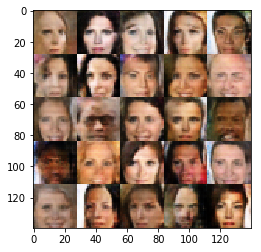

Epoch 2/2... Discriminator Loss: 1.3865... Generator Loss: 0.8207


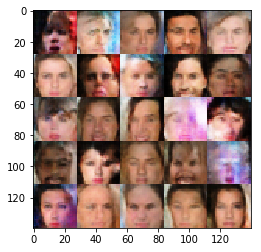

Epoch 2/2... Discriminator Loss: 1.3727... Generator Loss: 0.7415


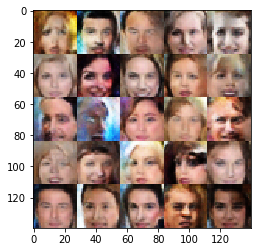

Epoch 2/2... Discriminator Loss: 1.1983... Generator Loss: 1.0540


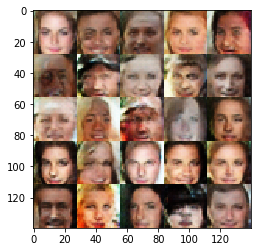

Epoch 2/2... Discriminator Loss: 1.4068... Generator Loss: 0.6279


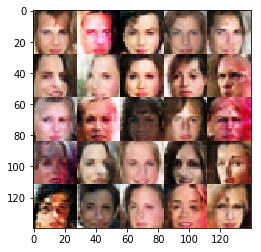

Epoch 2/2... Discriminator Loss: 1.2949... Generator Loss: 1.0076


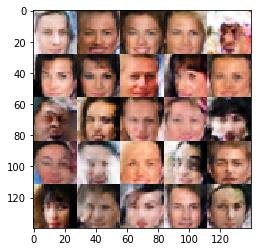

Epoch 2/2... Discriminator Loss: 1.3833... Generator Loss: 0.8087


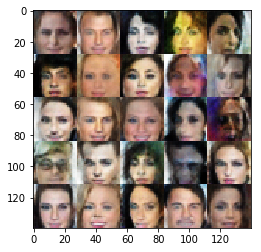

Epoch 2/2... Discriminator Loss: 1.4213... Generator Loss: 0.7533


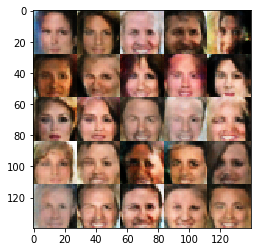

Epoch 2/2... Discriminator Loss: 1.2811... Generator Loss: 0.8226


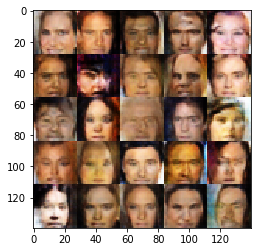

Epoch 2/2... Discriminator Loss: 1.2968... Generator Loss: 0.8200


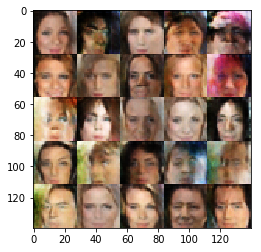

Epoch 2/2... Discriminator Loss: 1.3372... Generator Loss: 0.7924


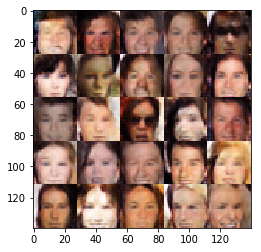

Epoch 2/2... Discriminator Loss: 1.3340... Generator Loss: 0.7975


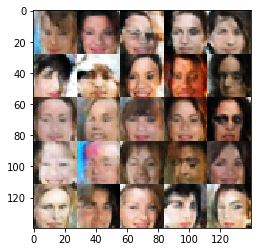

Epoch 2/2... Discriminator Loss: 1.4590... Generator Loss: 0.6382


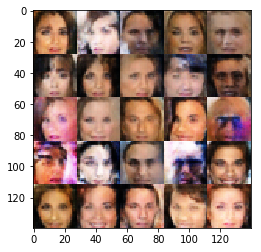

Epoch 2/2... Discriminator Loss: 1.4527... Generator Loss: 0.9010


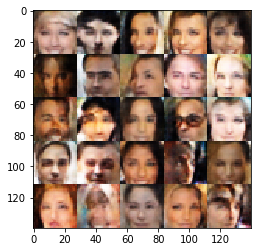

Epoch 2/2... Discriminator Loss: 1.3728... Generator Loss: 0.9633


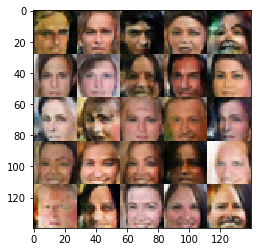

Epoch 2/2... Discriminator Loss: 1.2775... Generator Loss: 0.9118


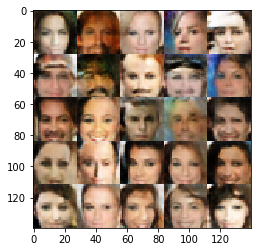

Epoch 2/2... Discriminator Loss: 1.1681... Generator Loss: 1.0299


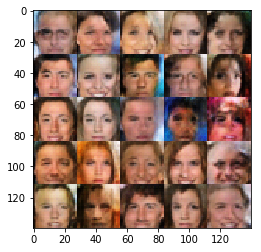

Epoch 2/2... Discriminator Loss: 1.3075... Generator Loss: 0.8698


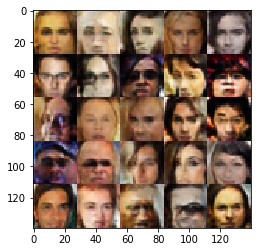

Epoch 2/2... Discriminator Loss: 1.3084... Generator Loss: 0.8918


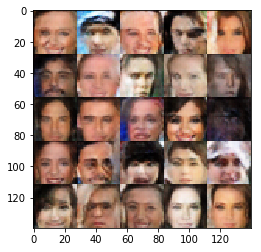

Epoch 2/2... Discriminator Loss: 1.3125... Generator Loss: 0.9980


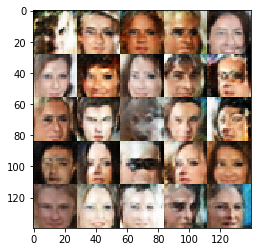

Epoch 2/2... Discriminator Loss: 1.4792... Generator Loss: 0.6128


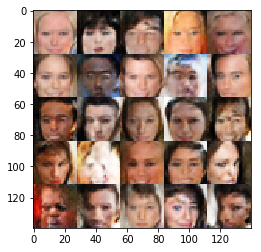

Epoch 2/2... Discriminator Loss: 1.2608... Generator Loss: 0.7835


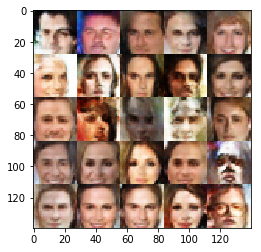

Epoch 2/2... Discriminator Loss: 1.3803... Generator Loss: 0.8008


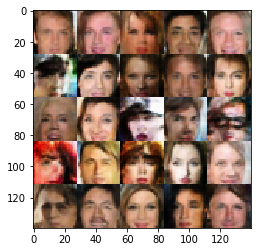

Epoch 2/2... Discriminator Loss: 1.4228... Generator Loss: 0.6429


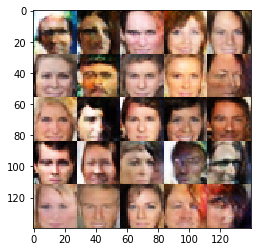

Epoch 2/2... Discriminator Loss: 1.2575... Generator Loss: 0.9124


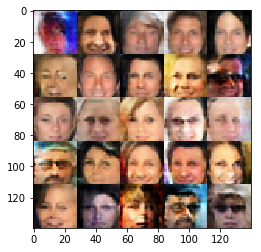

Epoch 2/2... Discriminator Loss: 1.1613... Generator Loss: 1.1507


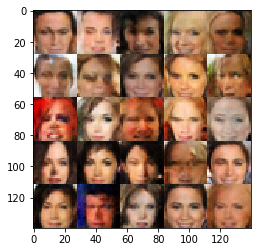

Epoch 2/2... Discriminator Loss: 1.5272... Generator Loss: 0.6851
done


In [14]:
batch_size = 32
z_dim = 100
learning_rate =0.0002
beta1 = 0.5

epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)